# Search YouTube videos using natural language

You can use this notebook to play with [OpenAI's CLIP](https://openai.com/blog/clip/) neural network for searching through YouTube videos using natural language.

## How it works

1. Download the YouTube video
2. Extract every N-th frame
3. Encode all frames using using CLIP
4. Encode a natural language search query using CLIP
5. Find the images that best match the search query

## Select a YouTube video

Paste a link to a YouTube video or choose one of the examples.

Choose a value for `N` which defines how many frames should be skipped. `N = 30` is usually about 1 frame every second.

In [1]:
# Dashcam video of driving around San Francisco
video_url = "https://www.youtube.com/watch?v=oYtsjAAtll8"

# How much frames to skip
N = 120

## Setup the environment

Install CLIP and install its dependencies.

In [2]:
# Install pytube to download YouTube videos
!pip install pytube

# ✅ Use latest version of plotly (compatible with NumPy 1.24+)
!pip install -U plotly

# Install CLIP from OpenAI GitHub
!pip install git+https://github.com/openai/CLIP.git

# Use PyTorch with CUDA/TPU compatibility (Colab already has it usually)
!pip install torch torchvision

  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-0m9qox93
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-0m9qox93
  Resolved https://github.com/openai/CLIP.git to commit dcba3cb2e2827b402d2701e7e1c7d9fed8a20ef1
  Preparing metadata (setup.py) ... done


## Download the video and process with CLIP

In this section the video is downloaded, every N-th frame is extracted and each frame is processed using CLIP.

Download the video locallyat 360p resoultion using `pytube`. A bigger resolution is not needed because CLIP scales down the images anyway.

In [3]:
pip install yt-dlp


In [4]:
!pip install imageio-ffmpeg


In [5]:
import os
import imageio_ffmpeg

# Set FFmpeg binary path for yt-dlp
os.environ["PATH"] += os.pathsep + os.path.dirname(imageio_ffmpeg.get_ffmpeg_exe())

# Confirm FFmpeg path
print("FFmpeg path:", imageio_ffmpeg.get_ffmpeg_exe())


FFmpeg path: /usr/local/lib/python3.11/dist-packages/imageio_ffmpeg/binaries/ffmpeg-linux-x86_64-v7.0.2


In [6]:
import yt_dlp

video_url = "https://www.youtube.com/watch?v=oYtsjAAtll8"

# Define options for 360p MP4 video
ydl_opts = {
    'format': 'bestvideo[height<=360][ext=mp4]+bestaudio[ext=m4a]/best[height<=360]',
    'outtmpl': 'video.mp4',
    'merge_output_format': 'mp4'
}

print("Downloading using yt-dlp...")

with yt_dlp.YoutubeDL(ydl_opts) as ydl:
    ydl.download([video_url])

print("Download completed.")


[youtube] Extracting URL: https://www.youtube.com/watch?v=oYtsjAAtll8
[youtube] oYtsjAAtll8: Downloading webpage
[youtube] oYtsjAAtll8: Downloading tv client config
[youtube] oYtsjAAtll8: Downloading tv player API JSON
[youtube] oYtsjAAtll8: Downloading ios player API JSON
[youtube] oYtsjAAtll8: Downloading m3u8 information
[info] oYtsjAAtll8: Downloading 1 format(s): 396+140
[download] video.mp4 has already been downloaded
Download completed.


Extract every `N-th` frame of the video.

In [7]:
import os
print("video.mp4 exists:", os.path.exists("video.mp4"))


video.mp4 exists: True


In [8]:
import cv2

capture = cv2.VideoCapture('video.mp4')
if not capture.isOpened():
    print("❌ Failed to open video file!")
else:
    print("✅ Video file opened successfully")


✅ Video file opened successfully


In [9]:
# How much frames to skip
N = 120

In [10]:
import cv2
from PIL import Image

video_frames = []
capture = cv2.VideoCapture('video.mp4')

if not capture.isOpened():
    print("❌ Could not open video.mp4")
else:
    print("✅ Video opened successfully")

ret, frame = capture.read()
if not ret:
    print("❌ Failed to read first frame.")
else:
    print("✅ First frame read successfully.")
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    img = Image.fromarray(frame_rgb)
    video_frames.append(img)
    img.show()

capture.release()
print(f"✅ Frames extracted: {len(video_frames)}")


✅ Video opened successfully
❌ Failed to read first frame.
✅ Frames extracted: 0


In [11]:
!apt-get install ffmpeg -y
!ffmpeg -i video.mp4 -c:v libx264 -crf 23 -preset veryfast clean_video.mp4


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq -

In [12]:
import os

print("Files in current directory:")
print(os.listdir())

# Check video size
video_path = "video.mp4"
if os.path.exists(video_path):
    print(f"✅ Found video: {video_path}, size: {os.path.getsize(video_path) / 1024:.2f} KB")
else:
    print("❌ Video not found")


Files in current directory:
['.config', 'clean_video.mp4', 'video.mp4', 'sample_data']
✅ Found video: video.mp4, size: 67193.61 KB


In [13]:
!apt-get install -y ffmpeg
!ffmpeg -i video.mp4 -c:v libx264 -crf 23 -preset veryfast -an clean_video.mp4


Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
ffmpeg is already the newest version (7:4.4.2-0ubuntu0.22.04.1).
0 upgraded, 0 newly installed, 0 to remove and 35 not upgraded.
ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq -

In [14]:
if video_frames:
    video_frames[0].show()


In [15]:
import cv2
from PIL import Image

N = 30  # Extract every 30th frame
video_frames = []

capture = cv2.VideoCapture('clean_video.mp4')

if not capture.isOpened():
    print("❌ Failed to open video")
else:
    print("✅ Video opened")

fps = capture.get(cv2.CAP_PROP_FPS)
print(f"FPS: {fps}")

frame_count = int(capture.get(cv2.CAP_PROP_FRAME_COUNT))
print(f"Total Frames: {frame_count}")

current_frame = 0

while current_frame < frame_count:
    capture.set(cv2.CAP_PROP_POS_FRAMES, current_frame)
    ret, frame = capture.read()

    if not ret:
        print(f"❌ Failed to read frame at {current_frame}")
        break

    # Convert BGR to RGB and store
    frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
    video_frames.append(Image.fromarray(frame_rgb))

    current_frame += N

capture.release()
print(f"✅ Frames extracted: {len(video_frames)}")


✅ Video opened
FPS: 30.0
Total Frames: 35255
✅ Frames extracted: 1176


Load the public CLIP model.

In [16]:
import clip
import torch

# Load the open CLIP model
device = "cuda" if torch.cuda.is_available() else "cpu"
model, preprocess = clip.load("ViT-B/32", device=device)

Encode all frames using CLIP. The encoding is done in batches for a better efficiency.

In [17]:
import math
import numpy as np
import torch

# You can try tuning the batch size for very large videos, but it should usually be OK
batch_size = 256
batches = math.ceil(len(video_frames) / batch_size)

# The encoded features will bs stored in video_features
video_features = torch.empty([0, 512], dtype=torch.float16).to(device)

# Process each batch
for i in range(batches):
  print(f"Processing batch {i+1}/{batches}")

  # Get the relevant frames
  batch_frames = video_frames[i*batch_size : (i+1)*batch_size]

  # Preprocess the images for the batch
  batch_preprocessed = torch.stack([preprocess(frame) for frame in batch_frames]).to(device)

  # Encode with CLIP and normalize
  with torch.no_grad():
    batch_features = model.encode_image(batch_preprocessed)
    batch_features /= batch_features.norm(dim=-1, keepdim=True)

  # Append the batch to the list containing all features
  video_features = torch.cat((video_features, batch_features))

# Print some stats
print(f"Features: {video_features.shape}")

Processing batch 1/5
Processing batch 2/5
Processing batch 3/5
Processing batch 4/5
Processing batch 5/5
Features: torch.Size([1176, 512])


## Define functions for searching the video

This section defines the functions used to search the video.

In [18]:
import plotly.express as px
import datetime
from IPython.core.display import HTML
import numpy as np

def search_video(search_query, display_heatmap=True, display_results_count=3):

  # Encode and normalize the search query using CLIP
  with torch.no_grad():
    text_features = model.encode_text(clip.tokenize(search_query).to(device))
    text_features /= text_features.norm(dim=-1, keepdim=True)

  # Compute the similarity between the search query and each frame using the Cosine similarity
  similarities = (100.0 * video_features @ text_features.T)
  values, best_photo_idx = similarities.topk(display_results_count, dim=0)

  # Display the heatmap
  if display_heatmap:
    print("Search query heatmap over the frames of the video:")
    # Create a dictionary to map numpy dtypes to plotly dtype_range format
    dtype_range = {
        np.bool_: (False, True),
        np.float16: (-1, 1),
        np.float32: (-1, 1),
    }
    fig = px.imshow(similarities.T.cpu().numpy(), height=50, aspect='auto', color_continuous_scale='viridis')
    fig.update_layout(coloraxis_showscale=False)
    fig.update_xaxes(showticklabels=False)
    fig.update_yaxes(showticklabels=False)
    fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
    fig.show()
    print()

  # Display the top 3 frames
  for frame_id in best_photo_idx:
    display(video_frames[frame_id])

    # Find the timestamp in the video and display it
    seconds = round(frame_id.cpu().numpy()[0] * N / fps)
    display(HTML(f"Found at {str(datetime.timedelta(seconds=seconds))} (<a target=\"_blank\" href=\"{video_url}&t={seconds}\">link</a>)"))

## Search queries

You can run the example search queries for some interesting results or you can try out your own.

On top of eah result you will also find a heatmap that shows how likely the search query is at all frames from the video.

### "A fire truck"

Search query heatmap over the frames of the video:


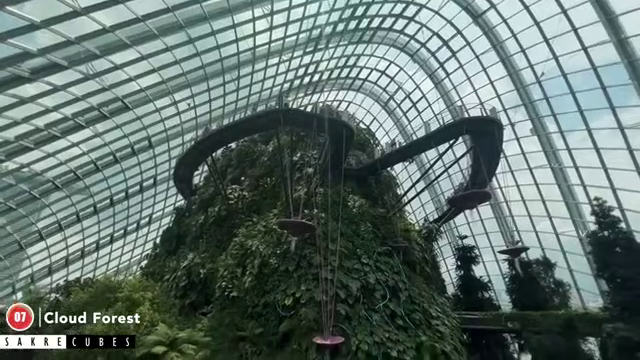

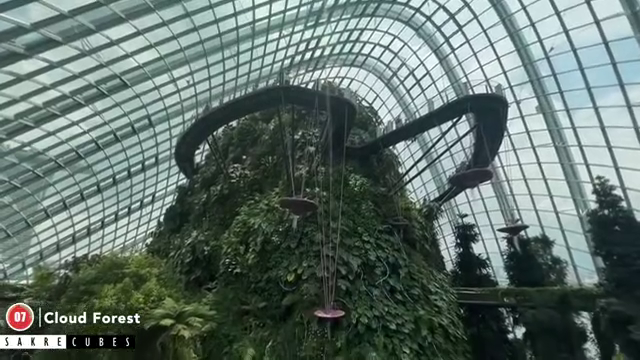

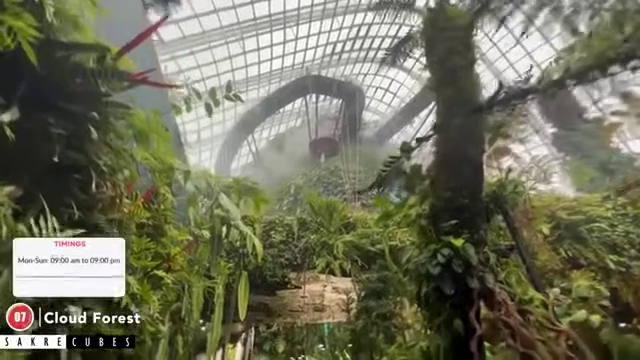

In [23]:
search_video("Cloud Forest")

### "Road works"

Search query heatmap over the frames of the video:


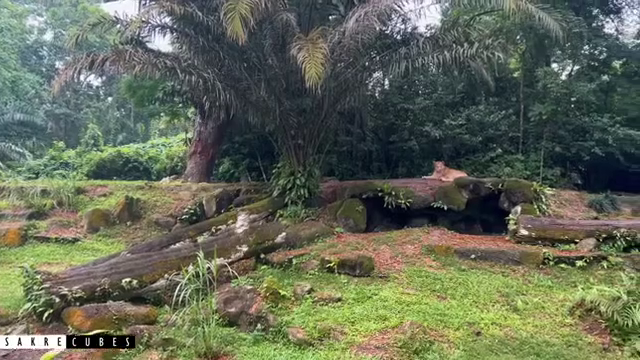

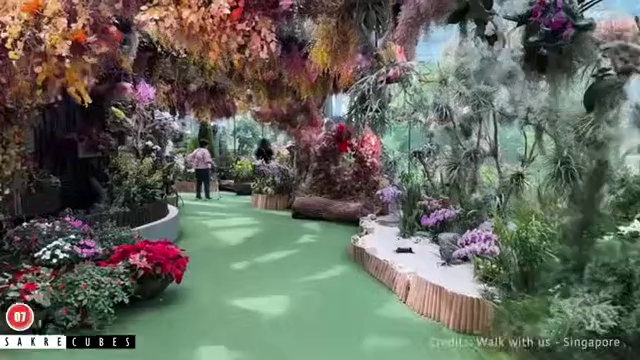

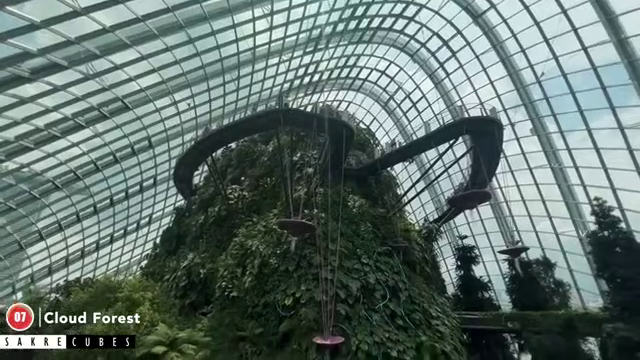

In [36]:
search_video("big tree")

### "People crossing the street"

Search query heatmap over the frames of the video:


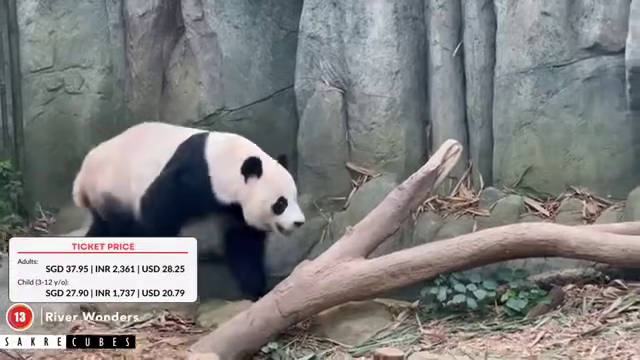

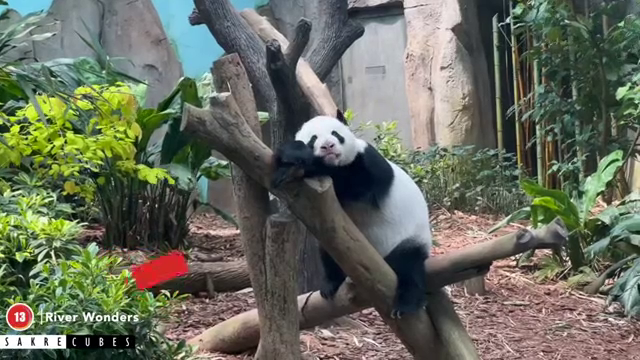

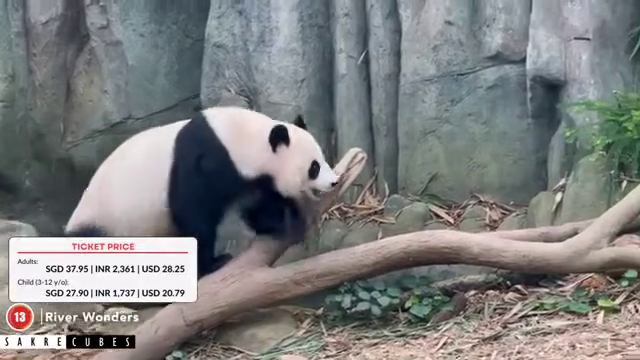

In [38]:
search_video("panda")

### "The Embarcadero"

Search query heatmap over the frames of the video:


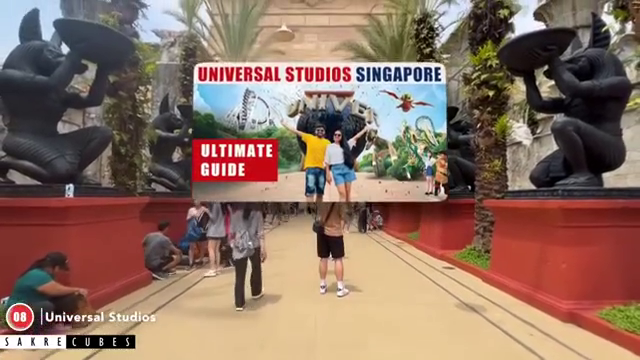

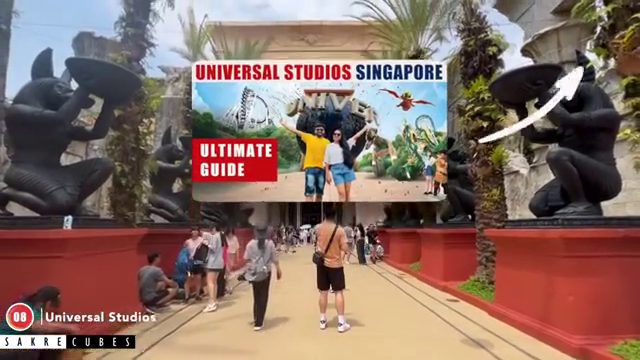

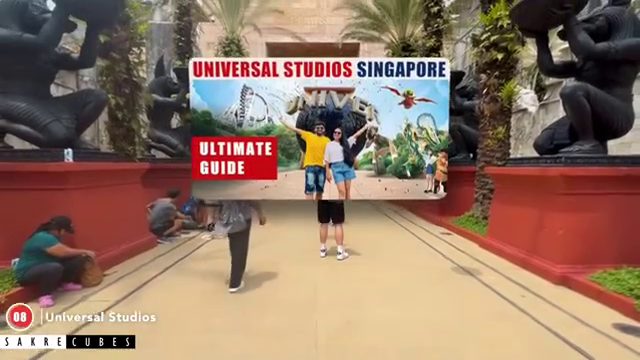

In [26]:
search_video("Universal Studios Singapore")

### "Waiting at the red light"

Search query heatmap over the frames of the video:


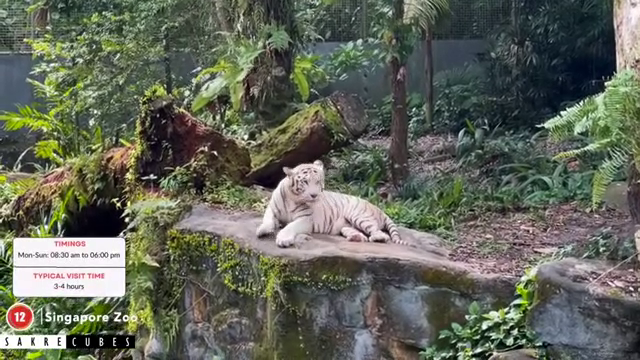

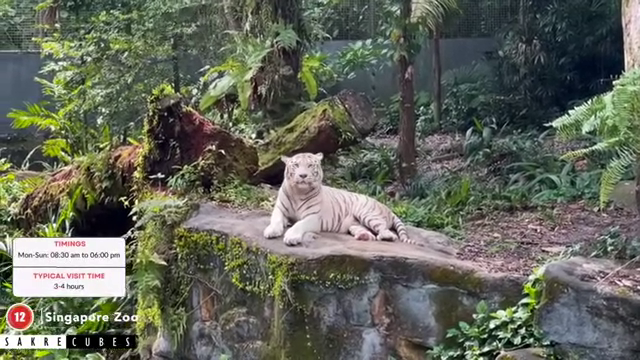

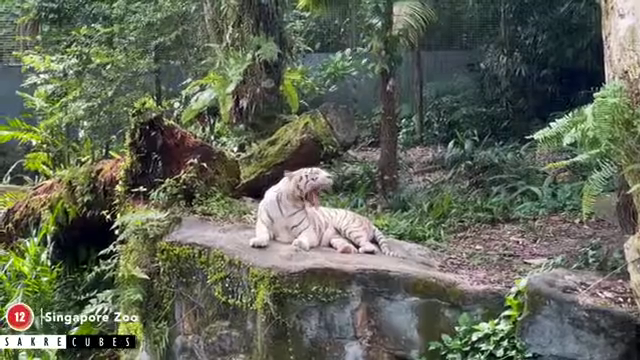

In [27]:
search_video("white tiger")

### "Green bike lane"

Search query heatmap over the frames of the video:


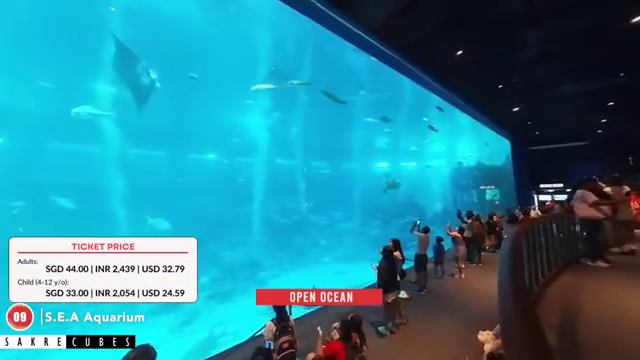

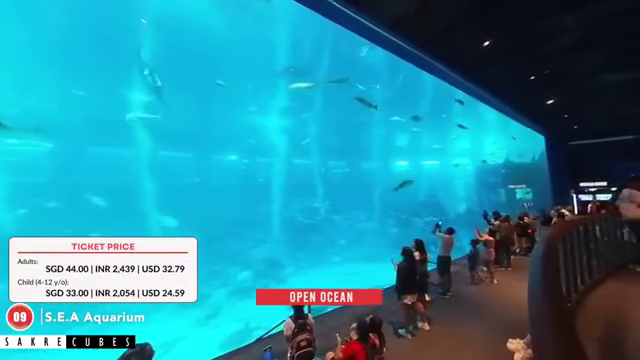

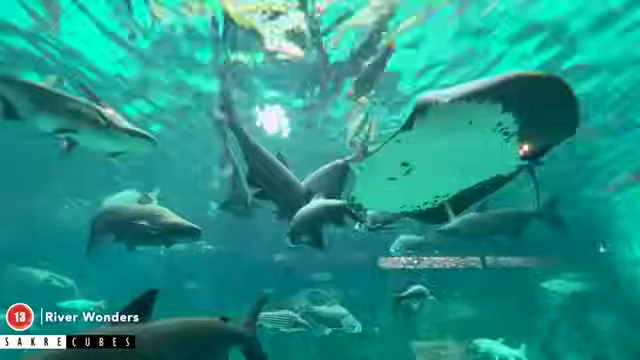

In [28]:
search_video("fishes")

### "A street with tram tracks"

Search query heatmap over the frames of the video:


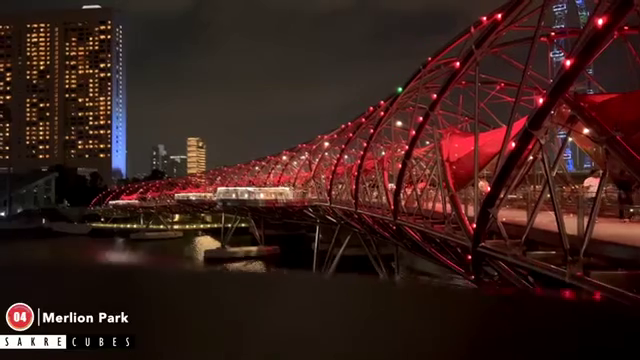

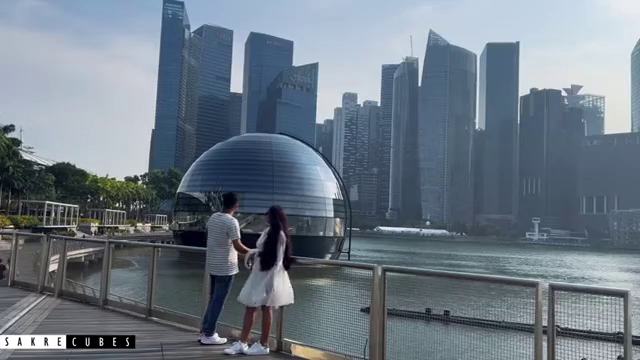

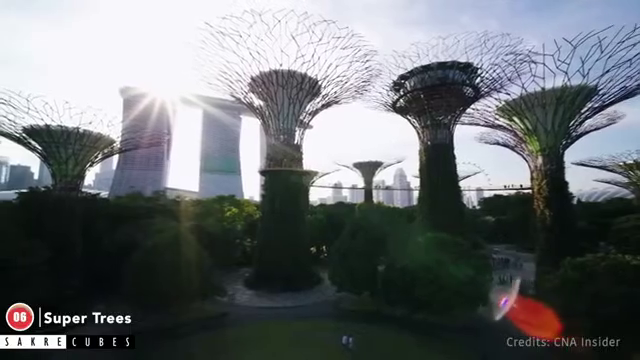

In [29]:
search_video("beautiful city")

### "The Transamerica Pyramid"

Search query heatmap over the frames of the video:


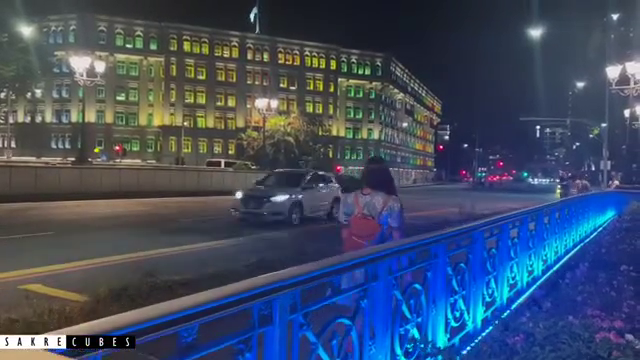

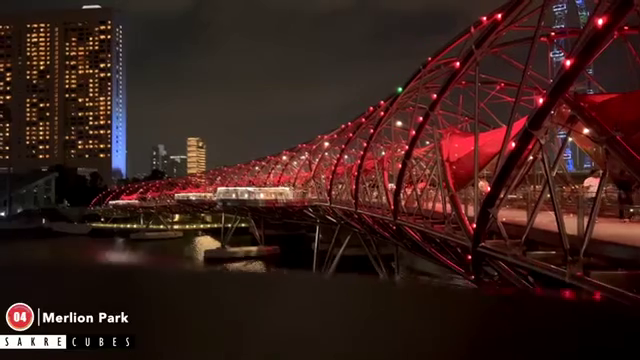

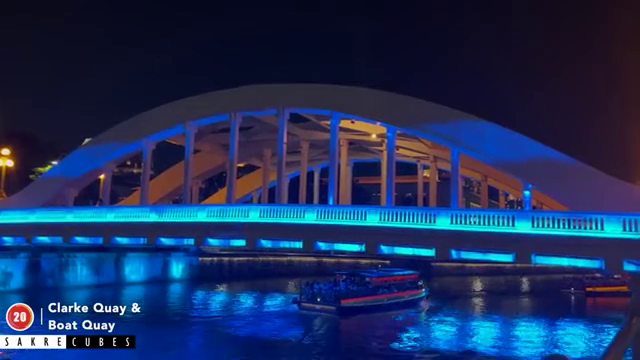

In [30]:
search_video("night photo")

Search query heatmap over the frames of the video:


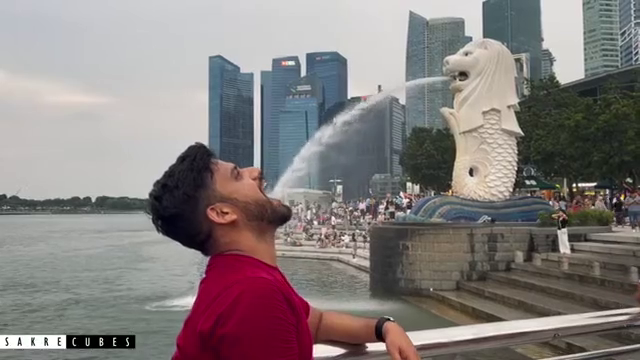

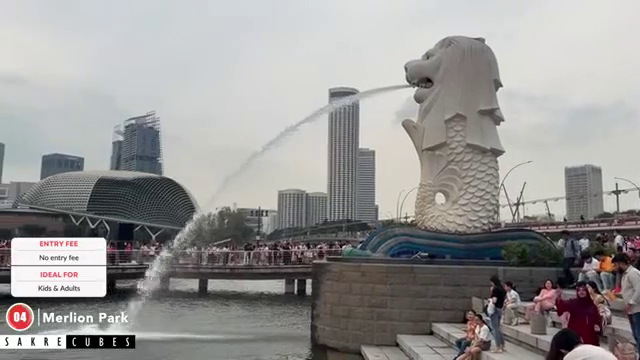

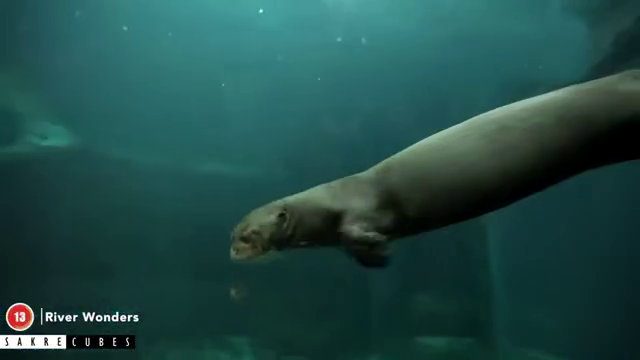

In [31]:
search_video("water flowing from mouth")